In [1]:
%load_ext autoreload
%autoreload 2

In [46]:
from saxs_data_processing import io, manipulate, target_comparison, subtract
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

## User parameter setup

List of all background files to use. Data loading function will find associated data files in the same directory as backgrounds.

In [3]:
background_fps = ['/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_05_StoberRandomCampaignV2/03210_B9-T1_Ethanol_background__000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_07_randomcampaignV3/data/03218_D1-T1_Ethanol_background_1_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_11_randomV3_round2/03289_H6-T2_EtOH_background_1_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_15_Highlights_replicates/03357_D5-T2_Background_1_EtOH_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_17_randomBaselineV4/data/03439_C1-T2_EtOH_1_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_11_05_optimizationRound1/03533_F9-T1_Ethanol_background_1_000.dat']

Select q ranges. Right now this relies on manual q range selection to a certain extent. We subtract background and fit the spline on a larger q-range, then evaluate the spline on a subset of the larger q range to avoid spline edge effects.

In [15]:
# q range to consider up to and including spline fit step
q_min_subtract = 0.002
q_max_subtract = 0.035

# q range to interpolate spline fit on and perform distance metric calculation with
q_min_spl = 0.003
q_max_spl = 0.03
n_interpolate_gridpts = 1001 # number of grid points to interpolate q on.

Select target particle parameters. Target is spherical particles with radius r and polydispersity pdi

In [16]:
target_r_nm = 60
target_r_angs = target_r_nm*10
target_pdi = 0.08
sld_silica = 8.575
sld_etoh = 9.611

Set processing and optimization parameters for distance calculation

In [23]:
# SavGol denoise filter parameters
savgol_n = 15
savgol_order = 3
# minimum data length - data with less than ~100 data points is due to valid data selection step in subtraction and is likley too noisy to do anything with.
min_data_len = 100

# spline fit parameters
s = 0.05
k = 3

#scale parameters
n_avg = 100

# Amplitude-phase distance parameters
optim = "DP"
grid_dim = 10

## ######################## STOP: Don't touch anything below here \#############################


## Load data

In [5]:
sample_data, uuid2bkg = io.load_biocube_data_with_background(background_fps, 24)

/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for b8953350-d5ad-4c99-b929-ebfe8febd0df. Check your file naming
  )
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for ea0d2ca6-8818-45f8-b5e3-04858133284a. Check your file naming
  )
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for 0ec4dd81-7487-4689-96b9-b0f646a2047d. Check your file naming
  )


## Calculate target scattering

In [20]:
q_grid = np.linspace(np.log10(q_min_spl), np.log10(q_max_spl), n_interpolate_gridpts)

q_grid_nonlog = 10**q_grid
target_I = target_comparison.target_intensities(q_grid_nonlog, target_r_angs, target_pdi, sld_silica, sld_etoh)
target_I = np.log10(target_I)

## Run full processing pipeline

In [33]:
processing_dataset = {}
for uuid_val, data_val in sample_data.items():
    meas_entry = {}
    meas_entry['original_data'] = data_val[0]
    background = uuid2bkg[uuid_val]
    meas_entry['background'] = background[0]
    # 1. Subtract background and select q range
    subtracted = subtract.chop_subtract(data_val[0], background[0], hiq_thresh=1)
    
    if subtracted is None:
        # if subtract returned None, data has issues and we are done with this sample
        meas_entry['status'] = 'failed'
        meas_entry['failure_point'] = 'background_subtraction'
        processing_dataset[uuid_val] = meas_entry
        print(f'Sample {uuid_val} failed at background subtraction')
        continue
        
    else:
        # q range selection
        subtracted = subtracted[subtracted['q'] < q_max_subtract]
        subtracted = subtracted[~subtracted['I'].isna()]
        subtracted = subtracted[subtracted['I'] > 0] # drop negative values 
        # screen on dataset length
        if len(subtracted) < min_data_len:
            meas_entry['status'] = 'failed'
            meas_entry['failure_point'] = 'subtracted_data_length'
            processing_dataset[uuid_val] = meas_entry
            print(f'Sample {uuid_val} failed due to data length')
            continue
        else:
            meas_entry['subtracted_clipped'] = subtracted
            meas_entry['status'] = valid
            processing_dataset[uuid_val] = meas_entry


    # 2. Convert everything into log10 space
    q_log = np.log10(subtracted['q'].to_numpy())
    I_log = np.log10(subtracted['I'].to_numpy())

    meas_entry['q_log'] = q_log
    meas_entry['I_log'] = I_log
    
    # 3. denoise filter on intensity
    
    I_savgol = manipulate.denoise_intensity(I_log, savgol_n = savgol_n, savgol_order = savgol_order)

    meas_entry['I_savgol'] = I_savgol

    # 4. Spline fit and interpolate
    I_spline = manipulate.fit_interpolate_spline(q_log, I_savgol, q_grid, s = s, k = k)
    
    meas_entry['I_spline'] = I_spline

    # 5. scale onto target
    I_scaled = manipulate.scale_intensity_highqavg(I_spline, target_I, n_avg = n_avg)

    meas_entry['I_scaled'] = I_scaled

    #6. Calculate AP distance

    amplitude, phase = target_comparison.ap_distance(q_grid, I_scaled, target_I, optim = optim, grid_dim = grid_dim)

    ap_sum = amplitude + phase

    meas_entry['amplitude_distance'] = amplitude
    meas_entry['phase_distance'] = phase
    meas_entry['ap_sum_distance'] = ap_sum

    processing_dataset[uuid_val] = meas_entry
    

/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:129: UserWarning: Failed to find region of valid data (low q limit not found). Check that your sample scatters reasonably well
  warnings.warn(
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:197: UserWarning: Issue during data selection, check data quality
  warnings.warn("Issue during data selection, check data quality")


Sample 23850c30-c572-41ad-abf0-7e1bd4fa7397 failed at background subtraction
Sample d03dab18-5712-44f7-9334-14047212632e failed due to data length
Sample 4d5fd07b-987b-49df-b4ba-54d2a337d945 failed due to data length
Sample 657e707f-abc9-4f86-ae1e-9e59efb6e1f9 failed due to data length
Sample 41414be7-3e27-4b4d-b70e-e31d54a733d3 failed at background subtraction
Sample fe8e4a28-cb6b-4396-adc3-a51f49838d54 failed at background subtraction
Sample ff3ac045-3c39-4fb0-b2c9-bf69d7600548 failed due to data length
Sample 5452fa4a-b64c-46d7-ace2-bf1b31afc3b3 failed due to data length


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/manipulate.py:145: RuntimeWarning: divide by zero encountered in log10
  I_scaled = np.log10(scaled_meas)


Sample 649ddf37-37fe-4a30-896b-010286133a28 failed due to data length
Sample f2e85141-9985-49ff-a6bc-17e2ecbcdc8b failed at background subtraction
Sample 8573b7f6-c239-4d33-aa19-58f59c7d0499 failed at background subtraction
Sample ba91b97c-6a58-431f-99ae-091ae1a16bc8 failed at background subtraction
Sample f180c1df-360c-45fe-9547-101530b6135a failed at background subtraction
Sample 86a7ac96-49f1-4da4-b518-37e4ab31a099 failed at background subtraction
Sample 4ccc9a11-4c0b-48a4-848e-edcdd5c8da69 failed at background subtraction


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:134: UserWarning: Insufficient data points in q range with scattering. Check data quality
  warnings.warn(


Sample d0e19177-de83-4147-ad9f-8c5e3a0aeedd failed due to data length
Sample bfcf29cb-db74-40a1-9d27-911985c3f28f failed due to data length
Sample a3e0413e-4e1b-4f07-930b-690692b49c03 failed at background subtraction
Sample 82d46018-8a24-4bb2-92b6-b4626d334344 failed at background subtraction
Sample 56faa977-e163-444a-9156-e2fa4f7fe338 failed at background subtraction
Sample a20c37f0-5b38-4a7c-bee3-d0d3d116c9e0 failed due to data length
Sample 81c548b0-7ef9-4ff0-b4e6-8977a3bb8ae4 failed at background subtraction
Sample 12720234-74cc-4a1a-9cdc-cad646138159 failed due to data length
Sample da8a1479-69d0-45be-b579-65c7a1dfa21b failed at background subtraction
Sample 86790201-b18a-4f73-907d-61e0d3d0c114 failed at background subtraction
Sample defeadd7-5618-448a-bc01-6cf057fbe1ac failed at background subtraction
Sample be0d7554-70c4-4a1f-a312-eea5e9ae1e45 failed at background subtraction
Sample 23709b8a-dfbe-4f00-b9a7-644344ee10e2 failed at background subtraction


### Sanity check subtraction

/tmp/ipykernel_111927/177862736.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


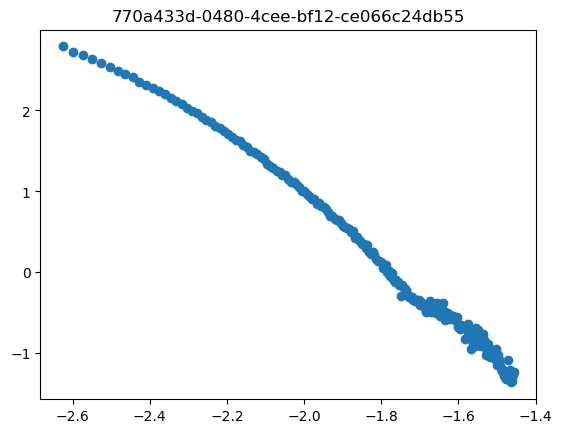

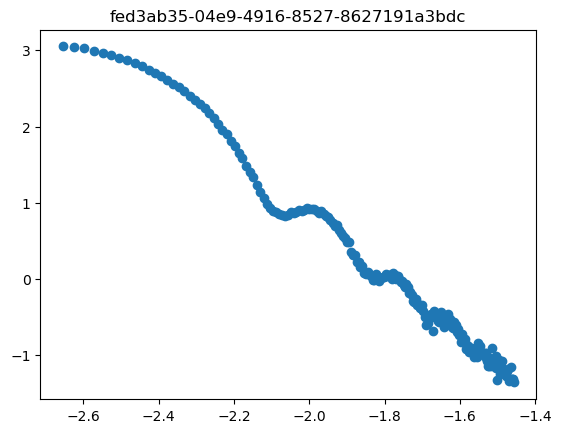

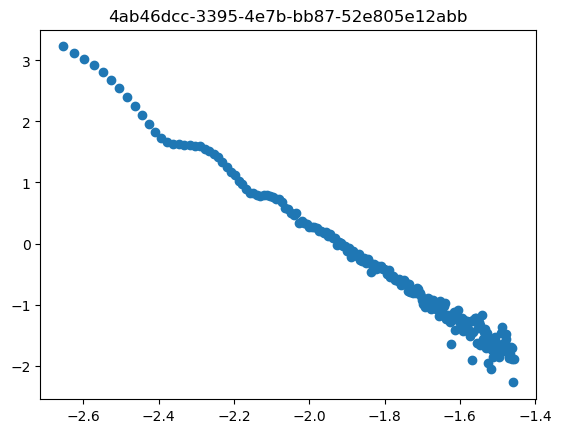

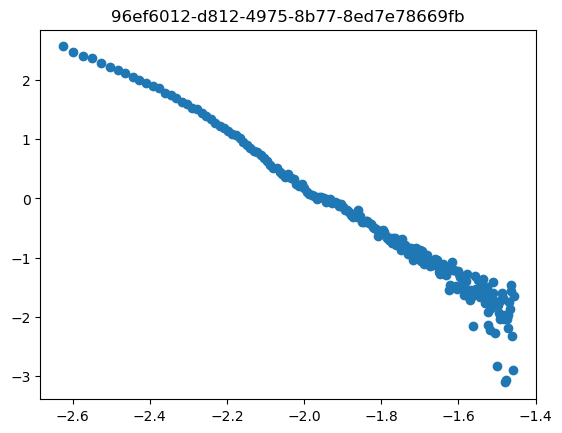

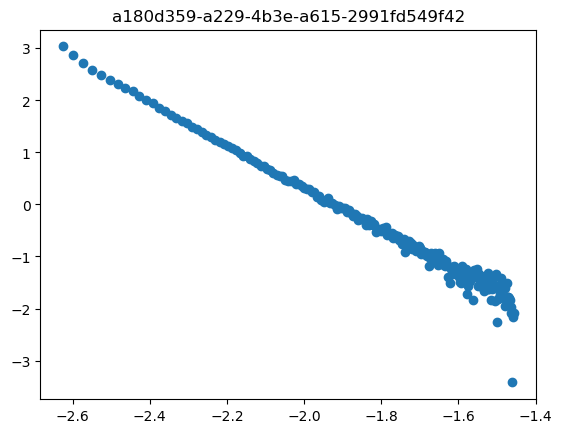

...

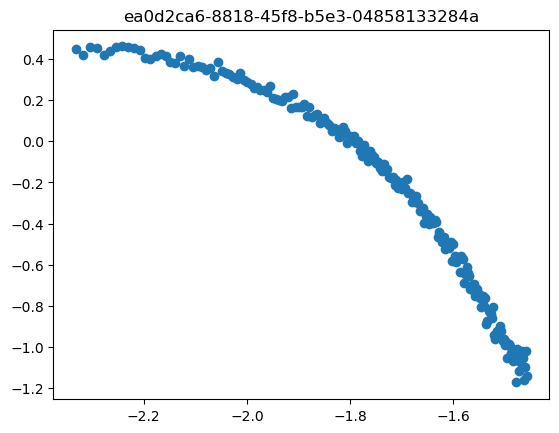

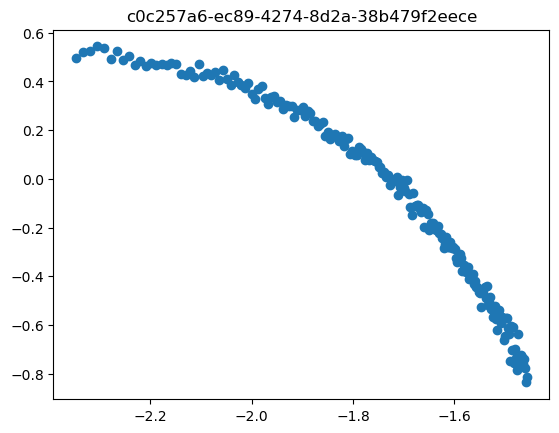

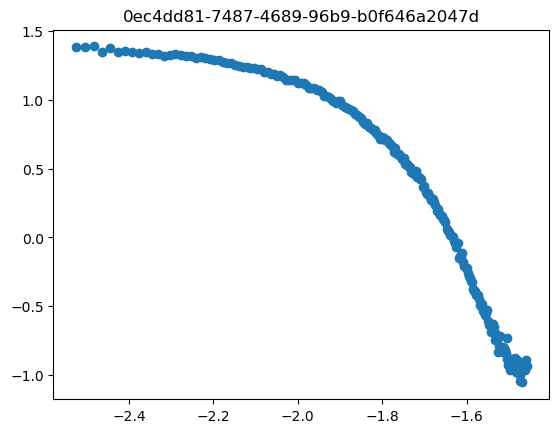

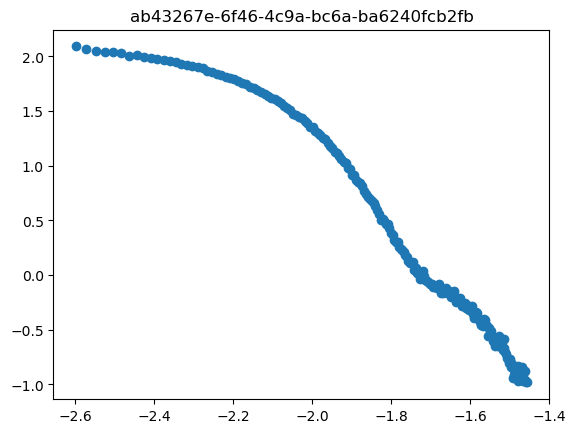

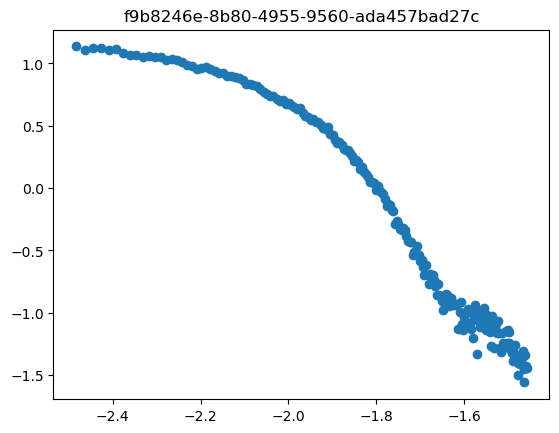

In [38]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']
    
        ax.scatter(q, I_subtracted)
        ax.set_title(uuid_val)

## Sanity check spline fit

/tmp/ipykernel_111927/3859189070.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


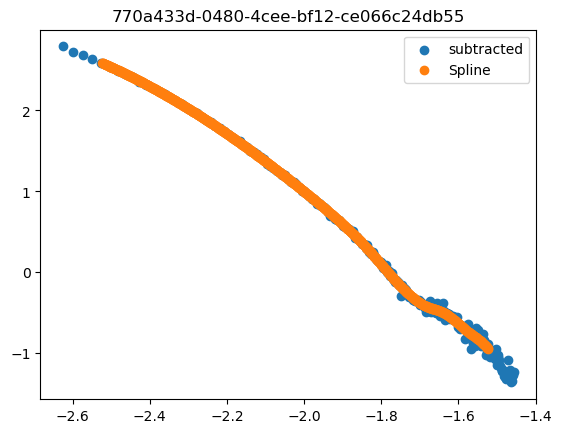

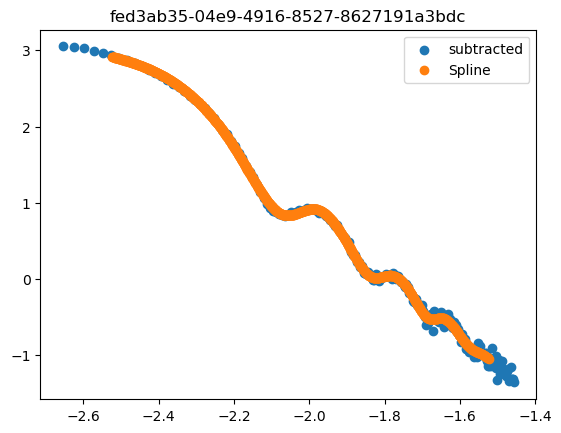

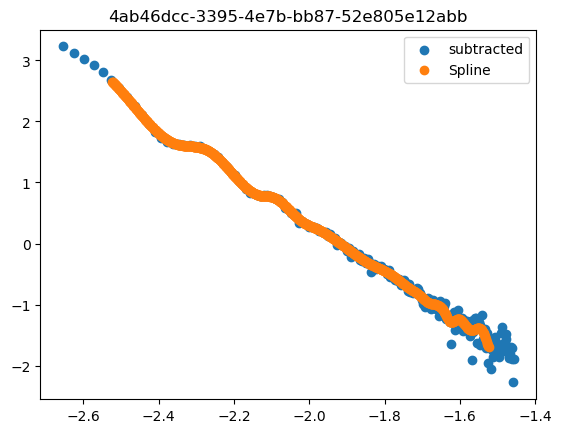

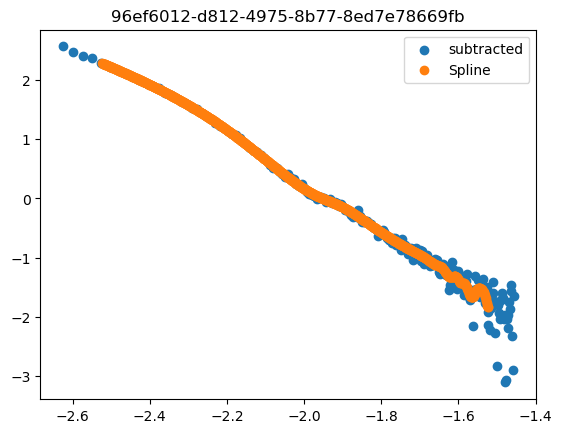

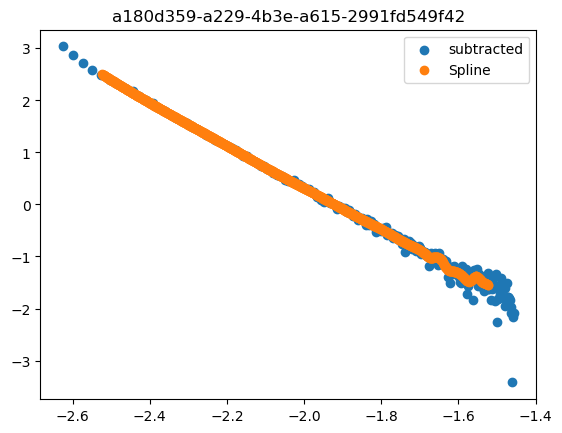

...

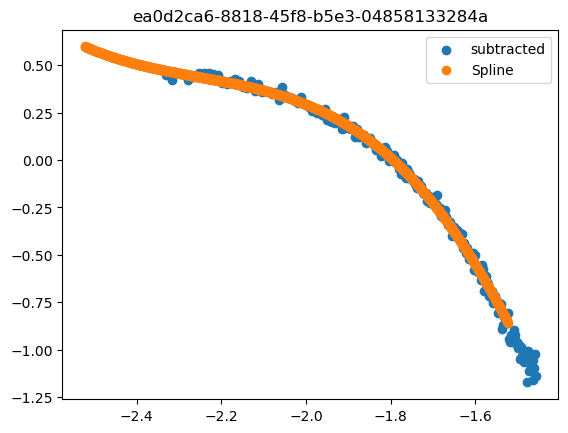

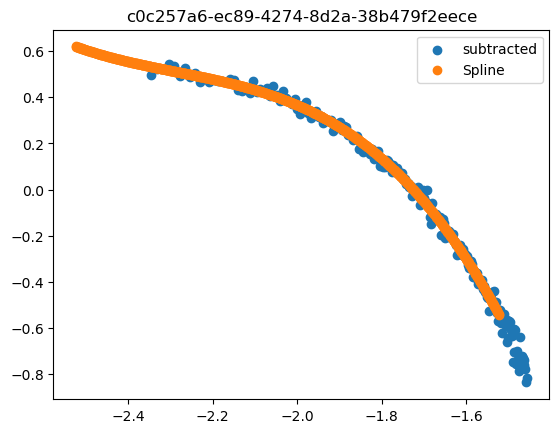

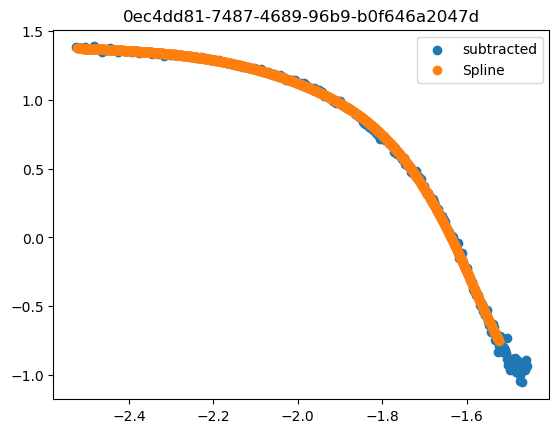

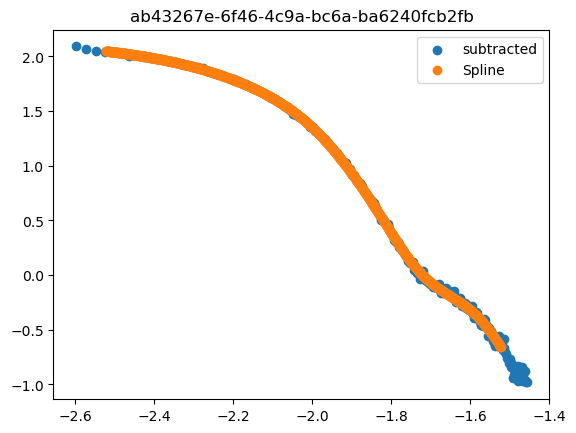

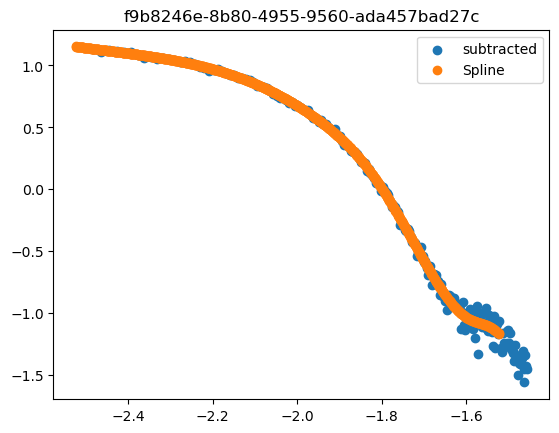

In [39]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']

        I_spline = entry['I_spline']
        
    
        ax.scatter(q, I_subtracted, label = 'subtracted')
        ax.scatter(q_grid, I_spline, label = 'Spline')
        ax.legend()
        ax.set_title(uuid_val)

## Sanity check scaling

/tmp/ipykernel_111927/1900914898.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


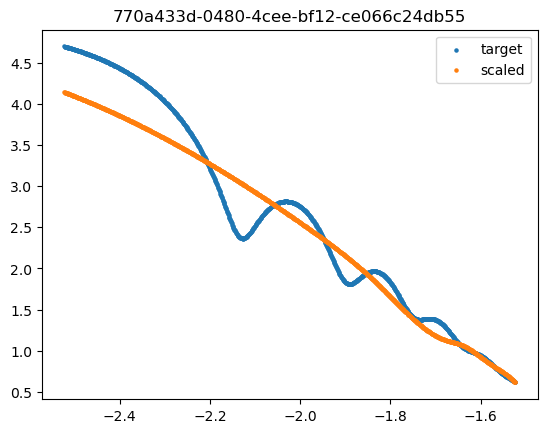

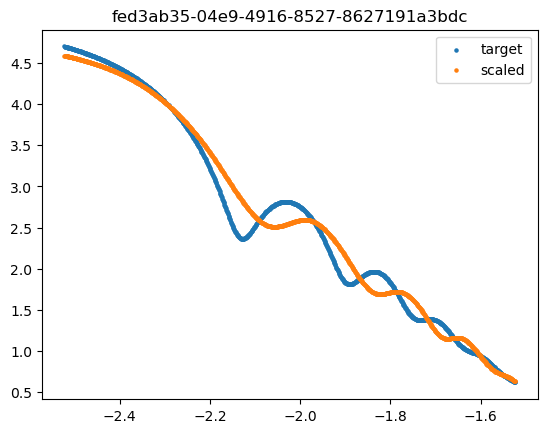

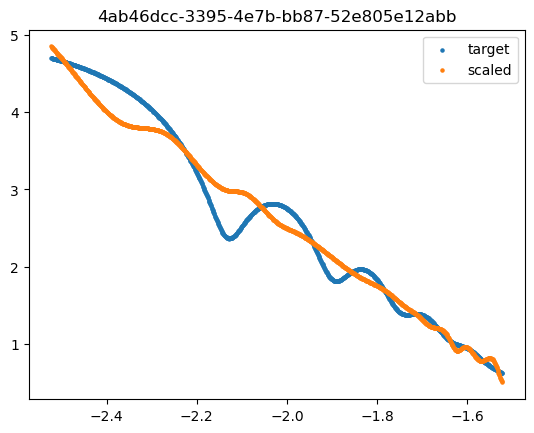

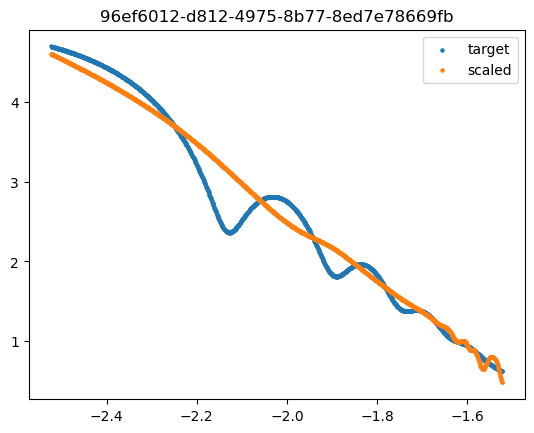

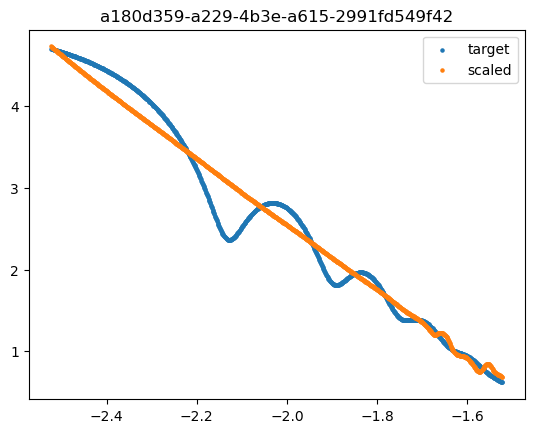

...

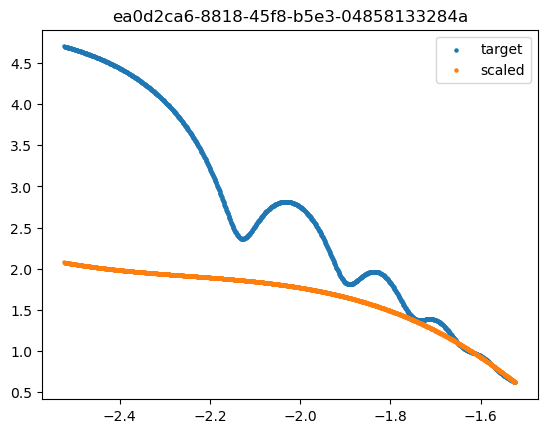

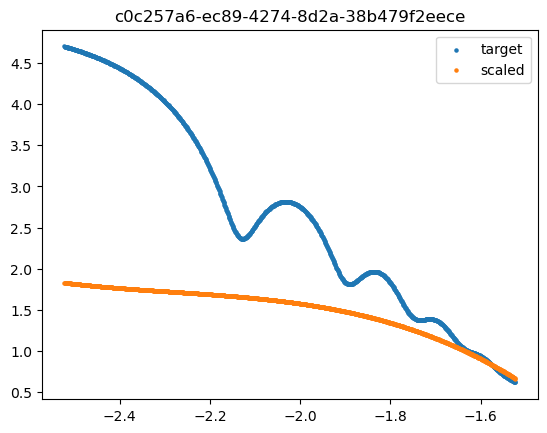

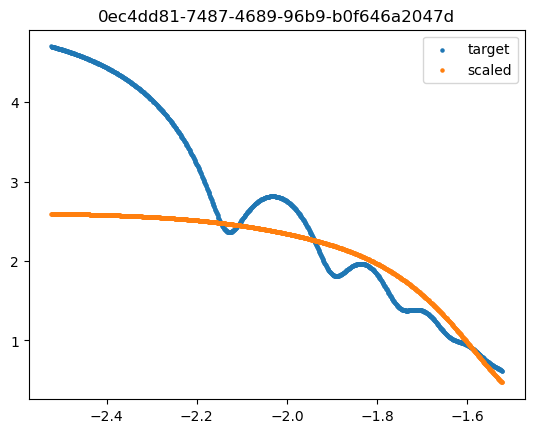

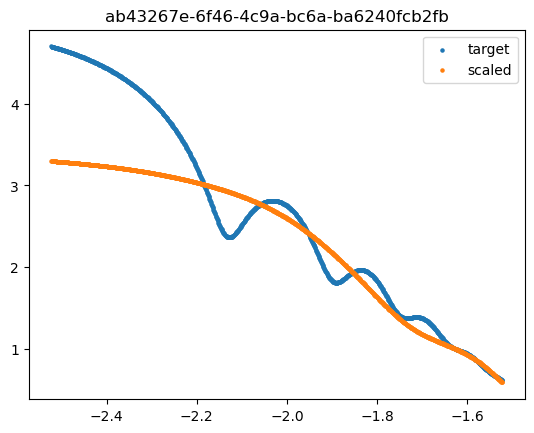

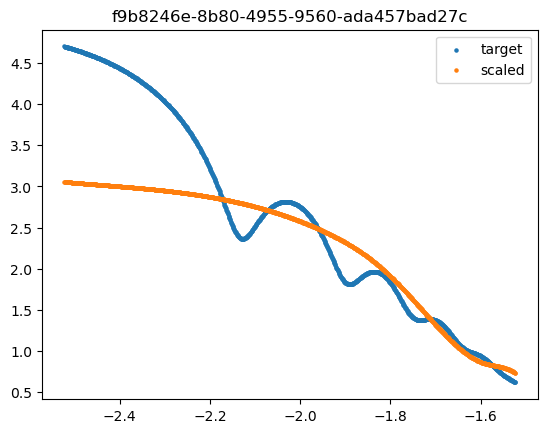

In [47]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()


        I_scaled = entry['I_scaled']
        
    
        ax.scatter(q_grid, target_I, label = 'target', s = 5)
        ax.scatter(q_grid, I_scaled, label = 'scaled', s = 5)
        ax.legend()
        ax.set_title(uuid_val)

## Plot final ranked order of best samples

In [42]:
sum_ap = {}
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        sum_ap[uuid_val] = entry['ap_sum_distance']


uuids = np.array(list(sum_ap.keys()))
rmses = list(sum_ap.values())
uuid_sorted_sum = uuids[np.argsort(rmses)]

In [48]:

with PdfPages('ranked_apdist_results.pdf') as pdf:
    for i, uuid_val in enumerate(uuid_sorted_sum):

        entry  = processing_dataset[uuid_val]
        I_scaled = entry['I_scaled']
        
        distance = sum_ap[uuid_val]
    
        fig, ax = plt.subplots()
        ax.scatter(q_grid, target_I)
        ax.scatter(q_grid, I_scaled)
        ax.set_title(uuid_val)
        ax.text(0.1, 0.05, f'Rank: {i}, sum distance: {distance}', transform = ax.transAxes)
        pdf.savefig()
        plt.close()